# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 3. Линейная регрессия.


**Правила, <font color="red">прочитайте внимательно</font>:**




* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds24_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.


**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографиями в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив их как файл (`pdf`/`png`/`jpg`) боту вместе с ноутбуком
    * *или* вставив ее в ноутбук посредством `Edit -> Insert Image` при редактировании markdown-ячейки (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $\LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). **<font color="red">Неправильно вставленные фотографии могут не передаться при отправке.</font>** Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.



**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 20 баллов
* Задача 2 &mdash; 80 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 50 баллов
* Задача 4 &mdash; 60 баллов
* Задача 5 &mdash; 30 баллов


In [632]:
# Bot check

# HW_ID: fpmi_ad3
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [737]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly
import plotly.express as px
import plotly.graph_objects as go

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [738]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn import metrics

---
### <font color="blue"><i>Легкая часть</i></font>

---
### Задача 1.

Рассмотрим одномерную линейную регрессию без свободного параметра $y(x) = \theta x$, где $x\in \mathbb{R}$ и $\theta \in \mathbb{R}$. Предполагаем, что данные получены по правилу
$$Y_i = \theta x_i + \varepsilon_i,$$
где $i \in \{1, ..., n\}$, числа $x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i$ &mdash; случайные ошибки.

**1.** Посчитайте оценку $\widehat{\theta}$ методом наименьших квадратов по явной формуле.

**2.** Выпишите формулы итераций градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$. Не забудьте указать, как в SGD математически определяется батч (набор объектов на каждой итерации).


*Замечания.* 
1. В ответе во всех пунктах могут оставаться суммы $n$ слагаемых, но не должно быть операций с векторами или матрицами.
2. **Прочитайте требования к формату решения в правилах сдачи задания.**

**Ответ:**
P.S. батч на каждой итерации выбирается заново, т.е. $I$ ~ $I_t$
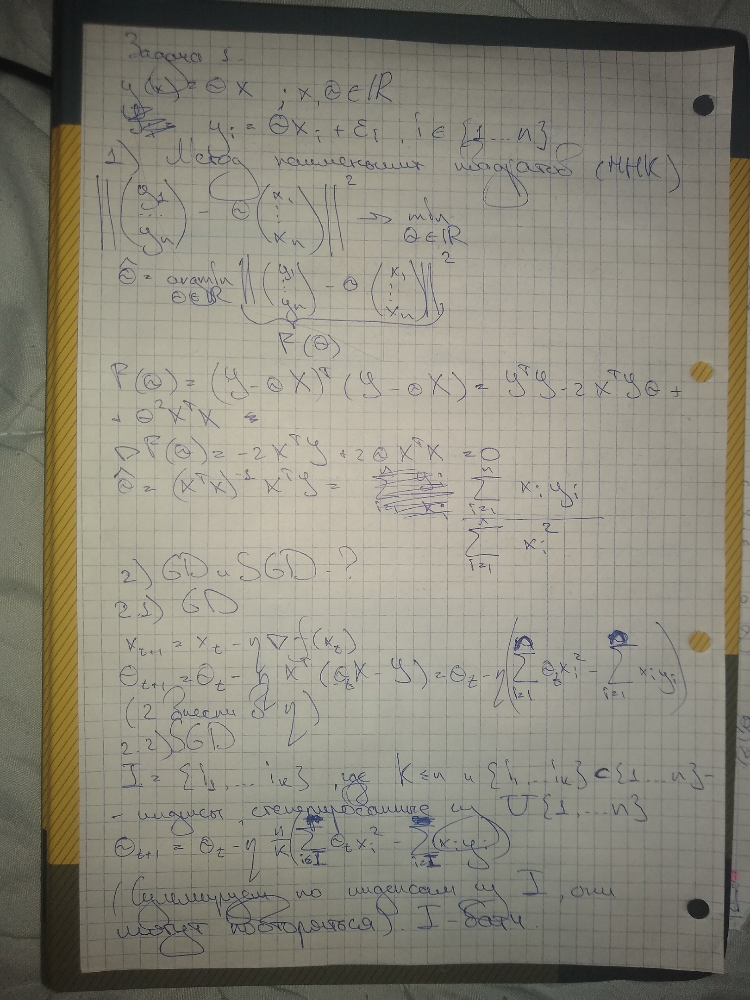

---
### Задача 2.

Скоро лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.

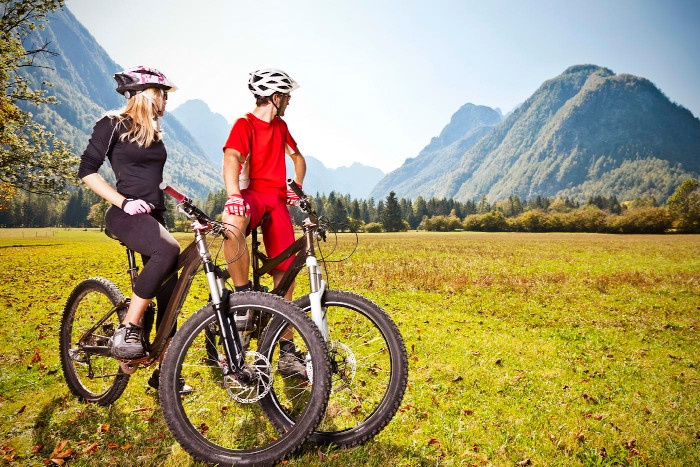

Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; зима, 2 &mdash; весна, 3 &mdash; лето, 4 &mdash; осень;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

Перед выполнением задания обязательно посмотрите <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html">ноутбук</a> с занятия по линейной регрессии.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [966]:
columns = [
    "season", "mnth", "holiday", "weekday", "workingday", "weathersit",
    "temp", "atemp", "hum", "windspeed", "cnt"
]

bikeshare = pd.read_csv("bike+sharing+dataset/day.csv", delimiter=",", usecols=columns)
bikeshare_train, bikeshare_test = train_test_split(bikeshare, test_size=0.2)

#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. Старайтесь строить информативные графики, а из финального решения убирать те, которые не пригодились.

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

*Указание*. Среди признаков есть такие, значения которых как-то упорядочены, и их относительно небольшое количество. Чтобы понять, являются ли они категориальными, попробуйте понять, как с их значениями будут работать линейные модели. Иначе говоря, допустимо ли с точки зрения природы данных выполнять арифметические операции между *любыми* значениями этого признака, согласуется ли это со смыслом, который несет в себе данный признак?

Разделим признаки на группы.

In [967]:
categorial_features = ["season", "mnth", "holiday", "weekday", "workingday", "weathersit"]
real_features = ["temp", "atemp", "hum", "windspeed"]
target_feature = "cnt"

Вспомогательные переменные для построения графиков.

In [968]:
titles = [
    "Сезон", "Месяц", "Праздничный день", "День недели", "Рабочий день", "Благоприятность погоды",
    "Температура", "Температура по ощущ.", "Влажность", "Скорость ветра",
]

month_filter = (
    (bikeshare_train.mnth == 1) |
    (bikeshare_train.mnth == 4) |
    (bikeshare_train.mnth == 7) |
    (bikeshare_train.mnth == 10)
)

weekday_filter = (
    (bikeshare_train.weekday == 0) |
    (bikeshare_train.weekday == 3) |
    (bikeshare_train.weekday == 6)
)

Построим графики плотности для категориальных признаков и scatter для числовых.

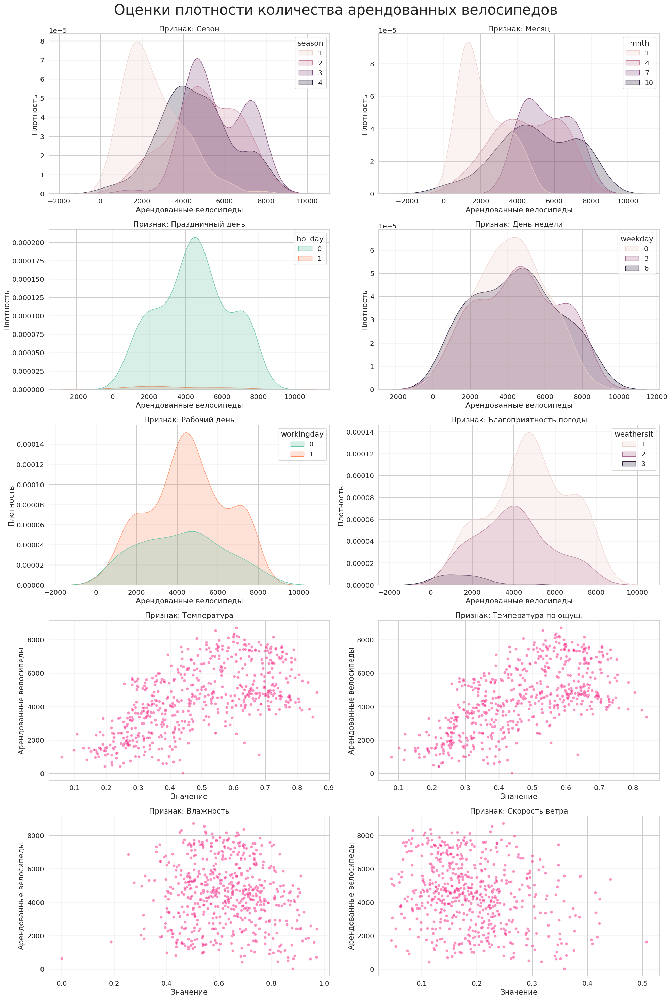

In [969]:
main_fig = plt.figure(figsize=(20, 30))

# Категориальные признаки
for i, hue in enumerate(categorial_features):
    fig = plt.subplot(5, 2, i + 1)
    
    kde_filter = [target_feature, hue]
    if hue == "mnth":
        kde_filter = month_filter
    elif hue == "weekday":
        kde_filter = weekday_filter
    
    subgraph = sns.kdeplot(
        data=bikeshare_train[[target_feature, hue]][kde_filter],
        x=target_feature,
        hue=hue,
        fill=True,
    )
    
    subgraph.set_title(f"Признак: {titles[i]}")
    plt.xlabel("Арендованные велосипеды")
    plt.ylabel("Плотность")
    
# Числовые признаки
for i, feature in enumerate(real_features):
    fig = plt.subplot(5, 2, i + 7) 
    
    subgraph = sns.scatterplot(
        data=bikeshare_train[[target_feature, feature]],
        x=feature,
        y=target_feature,
        alpha=0.5,
        color="#F72585"
    )
    
    subgraph.set_title(f"Признак: {titles[i + 6]}")
    plt.xlabel("Значение")
    plt.ylabel("Арендованные велосипеды")
    
plt.suptitle("Оценки плотности количества арендованных велосипедов", fontsize=30)
plt.tight_layout()
main_fig.subplots_adjust(top=0.95)

Вид графиков и логика подсказывает, что можно рассмотреть корреляцию таких признаков, как сезон и месяц, температура и температура по ощущ. Месяц и сезон рассматривать смысла особого не имеет, давайте хотя бы взглянем на температуру.

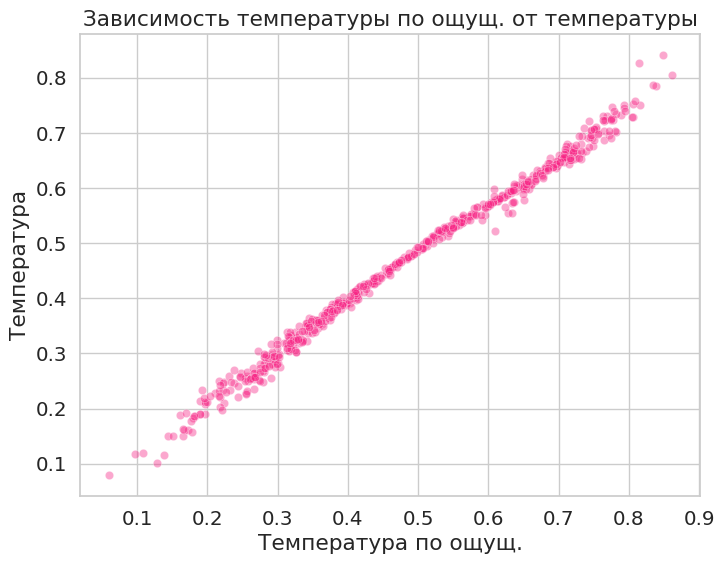

In [970]:
plt.figure(figsize=(8, 6))

sns.scatterplot(
    data=bikeshare_train[["temp", "atemp"]],
    x="temp",
    y="atemp",
    alpha=0.4,
    color="#F72585"
)

plt.title("Зависимость температуры по ощущ. от температуры")
plt.xlabel("Температура по ощущ.")
plt.ylabel("Температура")

plt.show()

И наконец построим график плотности самой величины, независимо от других признаков, чтобы отследить выбросы.

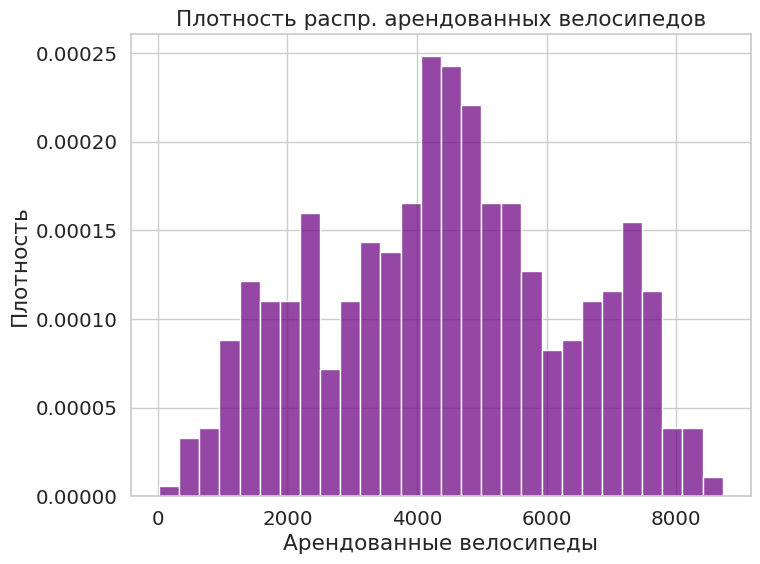

In [971]:
plt.figure(figsize=(8, 6))

fig = sns.histplot(bikeshare_train[target_feature],
             stat="density",
             bins=28,
             color="#720987")
fig.set_title("Плотность распр. арендованных велосипедов")
fig.set(xlabel="Арендованные велосипеды", ylabel="Плотность")

plt.show()

Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.

**Выводы по графикам:**

По большинству из представленных признаков наблюдаются зависимости (кроме, возможно, дня недели). Особенно сильно исследуемый признак зависит от праздников и рабочих/выходных дней, а также благоприятности погоды. Кроме того, из графиков по сезонам и месяцам видно, как снижается спрос на велосипеды в холодное время года. Также можно заметить, что велосипеды арендуются реже при высокой влажности и скорости ветра (дождливая погода).

Некоторые признаки зависят друг от друга.

Из вида графиков можно установить, что выбросы имеются, но их довольно мало. Графики плотности выглядят достаточно хорошо (кроме, возможно, графиков для сезона и месяца). На скаттер-графиках для числовых признаков выбросы отследить тяжело, поскольку зависимость прослеживается не очень явно. График плотности распределения самой величины тоже не демонстрирует наличия сильных выбросов.
 
Наблюдаемые зависимости кажутся более-менее линейными, но для таких признаков, как влажность и скорость ветра имеет смысл рассматривать индикаторы. Также можно заметить, что при высоких температурах наблюдается спад в спросе на велосипеды, так что имеет смысл рассмотреть функции вида $x^2$

#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, что-то еще. *Обратите внимание, от того, насколько качественно вы проведете визуальный анализ и подготовку данных, будет зависеть качество ваших моделей на следующих шагах.*

**Процедура предобработки данных:**

0) Процесс подготовки данных начался с загрузки данных и выделения исследуемого признака и категориальных и числовых, влияющих на него.
1) Удалим день недели, поскольку по нему зависимость не наблюдается. Удалим одну из температур, потому что они взаимно зависимы и будут переобучать модель. Аналогично для сезонов и месяцев.
2) Поскольку особых выбросов не наблюдается, просто уберем по 2.5% самых неудачных дней по аренде и велосипедов и самых удачных. Просто потому что эти данные выбиваются из общей закономерности.
3) Преобразование категориальных признаков в вещественные, путем кодировки в бинарные.
4) Шаг удаления пропусков и нормировки данных можно пропустить, поскольку данные уже нормированны, а пропуски отсутствуют. 

Реализуйте данную процедуру.

Удалим лишние колонки.

In [986]:
categorial_features = ["season", "holiday", "workingday", "weathersit"]
real_features = ["atemp", "hum", "windspeed"]
target_feature = "cnt"

Поработаем с выбросами.

In [987]:
bikeshare_train= bikeshare_train[
    (bikeshare_train.cnt < bikeshare_train.cnt.quantile(0.975)) &
    (bikeshare_train.cnt > bikeshare_train.cnt.quantile(0.025))
]

Выполним преобразование категориальных признаков.

In [988]:
encoder = OneHotEncoder(drop='first', sparse_output=False)
bikeshare_preprocessed = encoder.fit_transform(bikeshare_train[categorial_features])
bikeshare_preprocessed = np.hstack([bikeshare_train[real_features], bikeshare_preprocessed])

In [989]:
X_train, Y_train = bikeshare_preprocessed, bikeshare_train[target_feature]

А также заранее объявим вспомогательные функции, чтобы потом не писать каждый раз вручную.

In [990]:
def add_intercept(X: np.ndarray) -> np.ndarray:
    return np.column_stack(([1] * X.shape[0], X))


def mean_absolute_percentage_error(y_true: np.ndarray, y_pred: np.ndarray) -> np.ndarray:
    return metrics.mean_absolute_percentage_error(y_true, y_pred) * 100


def print_formatted_metrics(y_true: np.ndarray, y_pred: np.ndarray):
    print(
        f"RMSE: {metrics.mean_squared_error(y_true, y_pred) ** 0.5}\n"
        f"MAE: {metrics.mean_absolute_error(y_true, y_pred)}\n"
        f"MAPE: {mean_absolute_percentage_error(y_true, y_pred)}\n"
    )

#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов (в т.ч. свободный коэффициент).

In [991]:
model = LinearRegression(fit_intercept=True)
model.fit(X_train, Y_train)

model.intercept_, model.coef_

(2938.3741229611815,
 array([ 6421.30512602, -2584.96470628, -2844.82129501,   802.89218221,
          330.62583491,  1296.56089265,  -326.34584806,    94.96043277,
          -95.16303894, -1568.9736409 ]))

Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать (например, сбои в работе сервиса) но в то же время выбросы вносят существенный вклад в значение метрики. 

Применим преобразование категориальных признаков к тестовым данным и прогоним их через модель.

In [994]:
test_preprocessed = encoder.transform(bikeshare_test[categorial_features])
X_test = np.hstack([bikeshare_test[real_features], test_preprocessed])
Y_test = bikeshare_test[target_feature]

Y_predicted = model.predict(X_test)

Посчитаем ошибки при помощи метрик **RMSE, MAE, MAPE**.

In [995]:
print_formatted_metrics(Y_test, Y_predicted)

RMSE: 1313.1318389152793
MAE: 1096.8123979443933
MAPE: 26.52325381891778


Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. Не забудьте про константный признак. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками.

In [996]:
X, Y = add_intercept(X_train), Y_train
coefficients = np.linalg.inv(X.T @ X) @ X.T @ Y
Y_predicted =  add_intercept(X_test) @ coefficients

print_formatted_metrics(Y_test, Y_predicted)

RMSE: 1313.131838915275
MAE: 1096.812397944394
MAPE: 26.523253818918064


Ничего плохого не получилось. Взглянем на коэффициенты.

In [997]:
coefficients

array([ 2938.37412296,  6421.30512602, -2584.96470628, -2844.82129501,
         802.89218221,   330.62583491,  1296.56089265,  -326.34584806,
          94.96043277,   -95.16303894, -1568.9736409 ])

Коэффициенты вообще не отличаются от тех же в предыдущей модели. Вернем день недели, вторую температуру, месяц и сломаем все.

In [999]:
categorial_features = ["season", "mnth", "holiday", "weekday", "workingday", "weathersit"]
real_features = ["temp", "atemp", "hum", "windspeed"]

bikeshare_preprocessed = encoder.fit_transform(bikeshare_train[categorial_features])
bikeshare_preprocessed = np.hstack([bikeshare_train[real_features], bikeshare_preprocessed])

X_train, Y_train = bikeshare_preprocessed, bikeshare_train[target_feature]

test_preprocessed = encoder.transform(bikeshare_test[categorial_features])
X_test = np.hstack([bikeshare_test[real_features], test_preprocessed])
Y_test = bikeshare_test[target_feature]

Проверим библиотечную регрессию.


In [1000]:
model.fit(X_train, Y_train)
Y_predicted = model.predict(X_test)

print_formatted_metrics(Y_test, Y_predicted)

RMSE: 1327.4313842744643
MAE: 1087.6740724909291
MAPE: 26.016126222033375


Результат получился приемлемый. А теперь проверим явную формулу, заодно посмотрим на коэффициенты.

In [1001]:
X, Y = add_intercept(X_train), Y_train
coefficients = np.linalg.inv(X.T @ X) @ X.T @ Y
Y_predicted = add_intercept(X_test) @ coefficients

print_formatted_metrics(Y_test, Y_predicted)

RMSE: 426152.18853320583
MAE: 157351.52710621778
MAPE: 3566.7802121228633


In [1002]:
coefficients, model.coef_

(array([ 2.26335992e+05,  1.07324573e+07, -1.13161682e+07,  6.86268222e+04,
        -6.18148167e+05,  8.17175644e+04,  4.58806426e+04,  3.18895775e+04,
         7.64642482e+03, -5.85498735e+04, -1.06621754e+05, -2.74051585e+05,
        -4.09482290e+05, -4.11778052e+05, -3.66823465e+05, -3.52435043e+05,
        -9.30762757e+04, -1.84177952e+04, -2.63895428e+04,  1.15025263e+05,
        -6.37674711e+04,  2.06077716e+04,  3.17793463e+04, -2.06990989e+04,
        -1.26488145e+04,  1.00844489e+02,  7.33341255e+03, -6.70185627e+01,
        -1.49282269e+03]),
 array([-1194.14864285,  8116.58171037, -3031.29812311, -3095.9426492 ,
          471.58673294,   724.34313001,  1485.50311322,  -265.28262136,
          186.63298076,   286.02385669,   361.58531215,  -343.70276073,
         -888.75975928,  -660.2336564 ,   -71.97730262,  -117.65534266,
         -505.08910414,  -242.4652796 ,  -210.52247286,   -55.72037267,
          -30.44433904,    29.00349354,    27.01921298,   -28.57992895,
         

Можно заметить, как сильно разрослись коэффициенты для явной формулы. Коэффициенты для библиотечной регрессии же вполне нормальны.

Исправьте эту проблему, посчитайте оценки коэффициентов, а также ошибку предсказания.

См. выше

Сделайте выводы.

**Выводы:** не стоит использовать взаимно-зависимые признаки, поскольку они мешают обращению матрицы в явной формуле, а также переобучают модель. Также не стоит использовать признаки, не влияющие на исследуемое значение. Кроме того, это демонстрирует недостаток решения задачи методом МНК (явной формулой), лучше использовать GD и SGD (возможно так и делает библиотечная функция, потому что результат ее вычислений не сильно меняется в зависимости от наличия удаленных признаков).

*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

---
### <font color="orange"><i>Сложная часть</i></font>

---
### Задача 3.

Как можно было увидеть ранее, оценки коэффициентов становятся слишком большими при наличии некоторых проблем с данными. Чтобы этого не происходило, часто выполняют процедуру *регуляризации* в модели. 

Пусть $X \in \mathbb{R}^{n \times d}$ &mdash; матрица признаков, $Y \in \mathbb{R}^{n}$ &mdash; вектор значений целевого признака, $\theta \in \mathbb{R}^{d}$ &mdash; неизвестный вектор параметров. В методе наименьших квадратов решается задача
$$\| Y - X\theta \|^2 \longrightarrow \min_\theta.$$
Регуляризация заключается в искусственном усечении значений вектора оценок коэффициентов путем добавления его нормы к оптимизируемому функционалу. Тем самым решается задача
$$\| Y - X\theta \|^2 + \lambda \| \theta \|^2 \longrightarrow \min_\theta,$$
где $\lambda > 0$ &mdash; гиперпараметр модели, то есть число, которое задается пользователем. Такая модель называется **Ridge-регрессией**.

*Замечание.* Такая модель дает некоторое *другое приближение* неизвестной зависимости. Но неправильно думать, что она не может дать "правильный" ответ, потому как понятия "правильный ответ" в подобных задачах не существует. Можно получить только *более качественное приближение* согласно выбранной метрике, например, RMSE.

**1.** Найдите оценку $\theta$ в модели ridge-регрессии в матричном виде. Сравните ее с оценкой коэффициентов в методе наименьших квадратов. Помогает ли она избавиться от проблемы обратимости матрицы в МНК, которая обсуждалась на занятии?

**2.** Выпишите формулу поиска оценки коэффициентов методом *градиентного спуска* и *стохастического градиентного спуска* для модели ridge-регрессии в матричном виде. Не забудьте указать, как математически определяется батч (набор объектов на каждой итерации).

**3.** Многие модели машинного обучения требуют *стандартизацию признаков*. Существует множество различных способов стандартизации, из которых наиболее распространены два следующих.
1. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html"><it>StandardScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ &mdash; выборочное среднее значение признака $j$ (функция `np.mean`), а $s^2_j$ &mdash; выборочную дисперсию признака $j$ (функция `np.var`). Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{s_j}.$$
2. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html"><it>MinMaxScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ и $M_j$ &mdash; минимальное и максимальное значения признака $j$ соответственно. Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{M_j - m_j}.$$

Для метода наименьших квадратов стандартизацию признаков можно не производить, однако для модели ridge-регрессии стандартизация необходима. Поясните это. Можно представить, что признаки имеют некоторые различные единицы измерения.

**Ответ:** 3) Для МНК стандартизацию можно не производить, потому что коэффициент при соответствующих признаках сам подстроится под нужное значение при минимизации значения. Если рассуждать в терминах единиц измерения, коэффициент $\theta$ подстраивается под нужную единицу измерения.
Для ridge-регрессии стандартизация нужна, потому что разница в "единицах измерения" отобразится в норме вектора оценки коэффициентов.

P.S. батч на каждой итерации выбирается заново, т.е. $I$ ~ $I_t$

![Task2-1.jpg](attachment:e75bb2ab-209f-4205-8e01-1d98aa4352b4.jpg)

![Task2-2.jpg](attachment:97e1a180-6cc9-45dd-b051-cd7164051d2b.jpg)

---
### Задача 4.

В данной задаче мы продолжим анализировать данные велопроката из задачи 2, используя указанные в ней признаки.

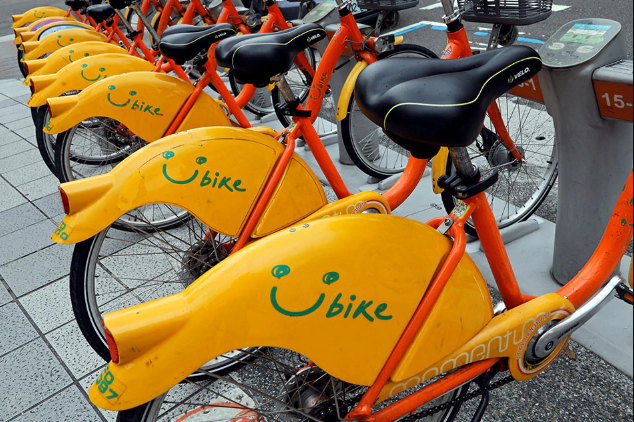

Для начала реализуйте класс для работы с моделью ridge-регрессии, используя явную формулу из предыдущей задачи. Интерфейс этого класса соответствует стандарту библиотеки `sklearn`, который использует также множество других библиотек.

In [1003]:
class RidgeRegression:
    def __init__(self, lambd=0.1, fit_intercept=True):
        """
        Инициализация модели.
        
        Аргументы:
        lambd -- параметр регуляризации.
        fit_intercept -- добавить ли константный признак.
        """
        
        self.lambd = lambd
        self.fit_intercept = fit_intercept
        self.scaler = MinMaxScaler()
        self.coefficients = None
        
    def fit(self, X: np.ndarray, Y: np.ndarray):
        """
        Обучение модели ridge-регрессии.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        Y -- numpy-вектор значений целевого признака размера (n,).
        """
            
        X = self.scaler.fit_transform(X)        
        if self.fit_intercept:
            X = add_intercept(X)
        
        self.coefficients = np.linalg.inv(X.T @ X + self.lambd * np.eye(X.shape[1])) @ X.T @ Y
        
        return self

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Вычисление предсказаний.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        
        Возвращает:
        predictions -- предсказания в виде numpy-вектора размера (n,).
        """
            
        X = self.scaler.transform(X)
        if self.fit_intercept:
            X = add_intercept(X)
        
        return X @ self.coefficients
        
    @staticmethod
    def standard_scaler(X: np.ndarray) -> np.ndarray:
        """
        Реализация метода StandardScalar, которой я не буду пользоваться,
        чтобы не возникло проблем с дельтой.
        В методе используется деление на корень из дисперсии,
        но тяжело точно оценить момент, когда дисперсия достаточно мала
        и лучше взять ее за единицу, поэтому я доверюсь библиотечному методу.
        """
        
        denominator = np.sqrt(np.var(X, axis=0))
        
        for i in range(len(denominator)):
            denominator[i] = (1 if denominator[i] < 0.0005 else denominator[i])
        
        return (X - np.mean(X, axis=0)) / denominator

Разделите данные на три части &mdash; обучающую, валидационную и тестовую в соотношении 3:1:1. На первой из них вам необходимо проводить всю аналитику и обучать все модели &mdash; регрессию, скалирование и т.д.. Вторую вы будете использовать для выбора оптимального значения гиперпараметра. Наконец, тестовую выборку необходимо использовать только для вычисления итогового значения метрик выбранной модели. Именно эти числа вам нужно говорить заказчику.

Подробнее посмотрите в <a href="https://miptstats.github.io/courses/ad_fivt/lecture3_3.pdf">презентации</a> с занятия. Далее в данной задаче можно копировать код из предыдущих задач или использовать готовые инструменты.

In [1004]:
bikeshare_train, bikeshare_test = train_test_split(bikeshare, test_size=0.2)
bikeshare_train, bikeshare_validate = train_test_split(bikeshare_train, test_size=0.25)

Выполните необходимые преобразования признаков. Не забудьте, что <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#2.-Обучение">обучить преобразования</a> нужно только по обучающей выборке. Учтите все особенности, которые обсуждались ранее во второй задаче.

In [1005]:
categorial_features = ["season", "holiday", "workingday", "weathersit"]
real_features = ["atemp", "hum", "windspeed"]
target_feature = "cnt"

bikeshare_train= bikeshare_train[
    (bikeshare_train.cnt < bikeshare_train.cnt.quantile(0.975)) &
    (bikeshare_train.cnt > bikeshare_train.cnt.quantile(0.025))
]

code = encoder.fit_transform(bikeshare_train[categorial_features])
X_train = np.hstack([bikeshare_train[real_features], code])
Y_train = bikeshare_train[target_feature]

code = encoder.transform(bikeshare_validate[categorial_features])
X_validate = np.hstack([bikeshare_validate[real_features], code])
Y_validate = bikeshare_validate[target_feature]

code = encoder.transform(bikeshare_test[categorial_features])
X_test = np.hstack([bikeshare_test[real_features], code])
Y_test = bikeshare_test[target_feature]

Определите сетку значений гиперпараметра $\lambda$ и обучите для каждого значения сетки модель ridge-регрессии. Обычно эффективнее брать сетку в логарифмическом масштабе, воспользовавшись `np.logspace`.

In [1006]:
lambdas = np.logspace(-3, 3, 500)
models = np.empty(shape=(len(lambdas),), dtype=RidgeRegression)

for i, lambd in enumerate(lambdas):
    model = RidgeRegression(lambd)
    model.fit(X_train, Y_train)
    models[i] = model

Для каждой из них посчитайте ошибку по метрикам RMSE, MAE, MAPE по обучающей и валидационной выборкам. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать (например, сбои в работе сервиса) но в то же время выбросы вносят существенный вклад в значение метрики. 

Посчитаем ошибки.

In [1007]:
RMSE_train, MAE_train, MAPE_train, RMSE_validate, MAE_validate, MAPE_validate =\
    [np.empty(shape=(len(lambdas),), dtype=np.float64) for _ in range(6)]

for i, model in enumerate(models):
    Y_predicted = model.predict(X_train)
    
    RMSE_train[i] = metrics.mean_squared_error(Y_train, Y_predicted) ** 0.5
    MAE_train[i] = metrics.mean_absolute_error(Y_train, Y_predicted)
    MAPE_train[i] = mean_absolute_percentage_error(Y_train, Y_predicted)
    
    Y_predicted = model.predict(X_validate)
    
    RMSE_validate[i] = metrics.mean_squared_error(Y_validate, Y_predicted) ** 0.5
    MAE_validate[i] = metrics.mean_absolute_error(Y_validate, Y_predicted)
    MAPE_validate[i] = mean_absolute_percentage_error(Y_validate, Y_predicted)

Для каждой метрики постройте графики зависимости значений метрики от значения гиперпараметра. Сравните поведение значений метрик для обучающей и валидационной выборок.

In [1008]:
fig1 = go.Figure()

fig1.add_trace(go.Scatter(x=lambdas, y=RMSE_train, name="Train RMSE"))
fig1.add_trace(go.Scatter(x=lambdas, y=RMSE_validate, name="Validate RMSE"))
fig1.add_trace(go.Scatter(x=lambdas, y=MAE_train, name="Train MAE"))
fig1.add_trace(go.Scatter(x=lambdas, y=MAE_validate, name="Validate MAE"))

fig1.update_layout(
    height=600,
    title_text="RMSE, MAE",
    title_font_size=20,
    xaxis_title="Значение гиперпараметра",
    yaxis_title="Арендованные велосипеды",
)

fig1.update_xaxes(type="log")

fig1.show()

In [1009]:
fig2 = go.Figure()

fig2.add_trace(go.Scatter(x=lambdas, y=MAPE_train, name="Train MAPE"))
fig2.add_trace(go.Scatter(x=lambdas, y=MAPE_validate, name="Validate MAPE"))

fig2.update_layout(
    height=600,
    title_text="MAPE",
    title_font_size=20,
    xaxis_title="Значение гиперпараметра",
    yaxis_title="Проценты(%)",
)

fig2.update_xaxes(type="log")

fig2.show()

Постройте также на одном графике кривые зависимости значений оценок коэффициентов от значений гиперпараметра. Какая наблюдается зависимость? Как вы это можете охарактеризовать?

*Замечание*. Возможно, будет информативнее рисовать графики в логарифмическом масштабе. Для наглядности можно также попробовать рисовать одним цветом все кривые, которые относятся к одному *исходному* признаку.

In [1010]:
coefficients_matrix = np.empty(shape=(len(models), len(models[0].coefficients)),
                               dtype=np.float64)

for i, model in enumerate(models):
    coefficients_matrix[i] = model.coefficients

In [1012]:
colors = px.colors.qualitative.Set2 + px.colors.qualitative.Antique

fig3 = go.Figure()

for column in range(coefficients_matrix.shape[1]):
    fig3.add_trace(
        go.Scatter(x=lambdas,
                   y=coefficients_matrix[:, column],
                   name=column + 1,
                   marker=go.scatter.Marker(color=colors[column]))
    )

fig3.update_layout(
    height=800,
    title_text="Зависимость коэффициентов от гиперпараметра",
    title_font_size=20,
    xaxis_title="Значение гиперпараметра",
    yaxis_title="Значение коэффициента",
)

fig3.update_xaxes(type="log")

fig3.show()

In [1013]:
plotly.offline.plot(fig1, filename="RMSE, MAE (Задание 4).html", auto_open=False)
plotly.offline.plot(fig2, filename="MAPE (Задание 4).html", auto_open=False)
plotly.offline.plot(fig3, filename="coefficients.html", auto_open=False)

'coefficients.html'

Можно видеть, что значения коэффициентов сходятся к 0 при увеличении значения гиперпараметра. Что и очевидно, модель старается минимизировать норму вектора оценки домноженную на гиперпараметр.

Выберите оптимальное значение гиперпараметра и посчитайте ошибку на тестовой выборке.

In [1015]:
lambd = 0.01

model = RidgeRegression(lambd)
model.fit(X_train, Y_train)
Y_predicted = model.predict(X_test)

print_formatted_metrics(Y_test, Y_predicted)

RMSE: 1352.0137968230729
MAE: 1147.668915083098
MAPE: 34.22356580400569


Сделайте выводы.

**Вывод:** при помощи модели ridge-регрессии (построенной по явной формуле) в совокупности со стандартизацией данных и разделением данных на 3 группы, были получены приближения, которые не сильно уступают тем же для линейной регрессии. 
Несмотря на то, что получившийся показатель **MAPE** на тестовой выборке великоват, остальные две метрики дают понять, что приближения получились не такими уж плохими.

---
### Задача 5.

Предположим, что имеющиеся у нас данные по велопрокату &mdash; большие данные. Конечно же в реальности это не так. Однако, для простой учебной задачи это в самый раз, чтобы ничего ни у кого не подвисало.

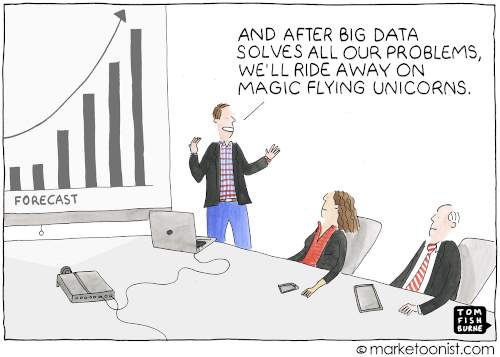

Выберите некоторое начальное приближение оценок коэффициентов, например, в начале координат.

Для начала стандартизируем данные и приведем их в нужный вид.

In [1016]:
X_train = model.scaler.transform(X_train)
X_validate = model.scaler.transform(X_validate)
X_test = model.scaler.transform(X_test)

X_train = add_intercept(X_train)
X_validate = add_intercept(X_validate)
X_test = add_intercept(X_test)

Выберем приближение.

In [1017]:
coefficients = np.ones(model.coefficients.shape)
coefficients.shape

(11,)

Реализуйте самостоятельно процедуру стохастического градиентного спуска для поиска оценок коэффициентов в модели ridge-регрессии. Размер батча (набор объектов на каждой итерации) обычно берут кратно степени двойки, например, 128 или 256. Значение $\lambda$ можно взять из предыдущей задачи.

Обратите внимание, что при неудачном выборе величины шага градиентного спуска $\eta$ (learning rate) метод может не сойтись. Пример приводился на лекции.

In [1018]:
steps = [coefficients]
PROBABILITY = 0.5

def SGD(X: np.ndarray, Y: np.ndarray, theta: np.ndarray, lambd: float,
        batch_size=256, eta=0.000005, delta=0.03) -> np.ndarray:
    coefficient = X.shape[0] / batch_size
    while True:
        # batch from normal distribution
        batch = np.asarray(np.random.uniform(
            low = 0,
            high=X.shape[0] - 1,
            size=batch_size
        ).round(), dtype=np.int64)
        
        X_batch, Y_batch = X[batch], Y[batch]
        
        theta_next = (
            theta - eta * coefficient * (
                X_batch.T @ X_batch @ theta +
                lambd * theta -
                X_batch.T @ Y_batch
            )
        )
        
        steps.append(theta_next)
        
        if (np.abs(theta_next - theta) < delta).all():
            return theta_next
        
        theta = theta_next

coefficients = SGD(X_train, Y_train.to_numpy(), coefficients, lambd)
coefficients, model.coefficients

(array([ 2375.20252872,  3577.80645881,  -907.00463109,  -578.01851592,
         1312.80841312,   931.05988528,  1563.29129186,  -452.83848526,
          282.95898318,  -405.02379749, -1477.10897749]),
 array([ 2681.61532767,  4342.50132388, -1587.93670955,  -935.65924621,
         1005.50634682,   477.45674726,  1404.02075262,  -619.89136699,
          251.39996142,  -247.68918036, -1368.84098256]))

Нарисуйте графики зависимости значений метрик RMSE, MAE, MAPE от номера итерации для обучающей и валидационной выборок. Сколько итераций пришлось совершить?

In [1019]:
RMSE_train, MAE_train, MAPE_train, RMSE_validate, MAE_validate, MAPE_validate =\
    [np.empty(shape=(len(steps),), dtype=np.float64) for _ in range(6)]

for i, coefficients in enumerate(steps):
    Y_predicted = X_train @ coefficients

    RMSE_train[i] = metrics.mean_squared_error(Y_train, Y_predicted) ** 0.5
    MAE_train[i] = metrics.mean_absolute_error(Y_train, Y_predicted)
    MAPE_train[i] = mean_absolute_percentage_error(Y_train, Y_predicted)

    Y_predicted = X_validate @ coefficients

    RMSE_validate[i] = metrics.mean_squared_error(Y_validate, Y_predicted) ** 0.5
    MAE_validate[i] = metrics.mean_absolute_error(Y_validate, Y_predicted)
    MAPE_validate[i] = mean_absolute_percentage_error(Y_validate, Y_predicted)

len(steps)

40976

Перемножение такого количества матриц на соответствующие коэффициенты занимает некоторое количество времени. Давайте взглянем на графики.

In [1024]:
x = [i for i in range(len(steps))]

fig1 = go.Figure()

fig1.add_trace(go.Scatter(x=x, y=RMSE_train, name="Train RMSE"))
fig1.add_trace(go.Scatter(x=x, y=RMSE_validate, name="Validate RMSE"))
fig1.add_trace(go.Scatter(x=x, y=MAE_train, name="Train MAE"))
fig1.add_trace(go.Scatter(x=x, y=MAE_validate, name="Validate MAE"))

fig1.update_layout(
    height=600,
    title_text="RMSE, MAE",
    title_font_size=20,
    xaxis_title="Шаг SGD",
    yaxis_title="Арендованные велосипеды",
)

fig1.show()

In [ ]:
fig2 = go.Figure()

fig2.add_trace(go.Scatter(x=x, y=MAPE_train, name="Train MAPE"))
fig2.add_trace(go.Scatter(x=x, y=MAPE_validate, name="Validate MAPE"))

fig2.update_layout(
    height=600,
    title_text="MAPE",
    title_font_size=20,
    xaxis_title="Шаг SGD",
    yaxis_title="Проценты(%)",
)

fig2.show()

In [ ]:
plotly.offline.plot(fig1, filename="RMSE, MAE (Задание 5).html", auto_open=False)
plotly.offline.plot(fig2, filename="MAPE (Задание 5).html", auto_open=False)

Конечные значения похожи на то, что мы получали раньше, но пока мы не проверили данные на тестовой выборке.

Посчитайте ошибку на тестовой выборке.

In [1023]:
Y_predicted = X_test @ coefficients

print_formatted_metrics(Y_test, Y_predicted)

RMSE: 1373.9549798373257
MAE: 1181.320292687124
MAPE: 35.41281670964427


Сделайте выводы.

**Вывод:**
При подборе соответствующих $\eta$, $\delta$, приходится искать такие значения, которые удовлетворяли бы следующим признакам:
1) Конечная оценка должна давать хорошее приближение ridge-регрессии
2) Оценки должны сойтись
3) Оценки должны сойтись достаточно быстро, чтобы мы смогли построить график по метрикам ошибок на шагах SGD (вообще это излишне, но в данном задании требуется)

Сравнивая коэффициенты, полученные методом SGD с коэффициентами, полученными по явной формуле, можно заметить, что, хоть они различаются, но все же кажутся довольно похожими. Результаты работы обеих моделей на тестовых дают очень близкие значения ошибок.

Сравнивая результаты работы обычной регрессии и ridge-регрессии, можно сделать вывод, что в **данном** случае с **использованными** признаками, линейная регрессия дает лучший результат. Объяснить это можно тем, что коэффициенты линейной регрессии не разрастались слишком сильно, поэтому регуляризация оказалась излишней.

